# Improve CLIP cat sorting method

We will add more sentences to sort cats into pretty/ugly categories and give a global rating.  

## install libs

In [1]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 38.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.0 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 

## load dataset

In [2]:
from datasets import load_dataset

cats_ds = load_dataset('the-french-artist/unique_9k_cats', split='train')
cats_ds

Generating train split:   0%|          | 0/9936 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'label'],
    num_rows: 9936
})

In [3]:
cats_df = cats_ds.to_pandas()
cats_df.head()

,image,label
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
4,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2


## handle images from the dataset

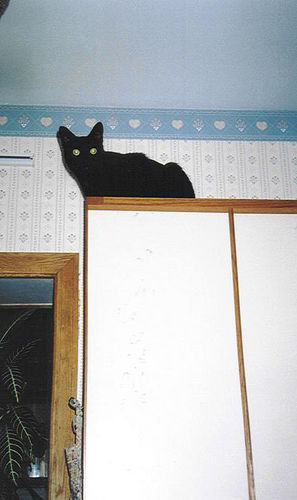

In [4]:
from PIL import Image
import io

def load_image(image_bytes):
    image = Image.open(io.BytesIO(image_bytes))
    return image

# Example usage:
image_data = cats_df.head(1).image.values[0]
image = load_image(image_data['bytes'])
display(image)

## Define clip function

In [5]:
import torch
import pandas as pd
import gc
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel

# Load the model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Check if GPU is available and move the model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

def get_similarity_scores_batch(image_paths, texts):
    try:
        # Load images
        images = [load_image(image_path) for image_path in image_paths]

        # Prepare processor inputs
        inputs = processor(text=texts, images=images, return_tensors="pt", padding=True)

        # Move tensors to GPU if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        inputs = {key: value.to(device) for key, value in inputs.items()}
        model.to(device)

        # Get model outputs
        outputs = model(**inputs)
        logits_per_image = outputs.logits_per_image
        logits_per_text = outputs.logits_per_text

        # Calculate similarity scores
        similarity_scores = logits_per_image.softmax(dim=1)

        # Convert output tensor to dataframe
        similarity_scores_df = pd.DataFrame(similarity_scores.detach().cpu().numpy(), columns=['pretty', 'ugly'])

        # Add image paths as first column
        similarity_scores_df.insert(0, 'image_path', image_paths)

    finally:
        # Ensure to free up VRAM
        del images, inputs, outputs, logits_per_image, logits_per_text, similarity_scores
        torch.cuda.empty_cache()
        gc.collect()

    return similarity_scores_df

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

## Select a subset to make faster tests

The dataset is 9k samples big, we will order 100 images from a random sample as a test

In [6]:
sample_df = cats_df.sample(n=100)
sample_df.head()

,image,label
4603,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,5
4025,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,5
6698,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,3
4462,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,5
5803,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,6


### extract "bytes" from dicts

In [7]:
def get_bytes(image):
  return image['bytes']

image_bytes_list = list(sample_df.image.apply(get_bytes))

## Perform inference on default sentences

In [8]:
texts = ["picture of a pretty cat", "picture of an ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)
cat_result

,image_path,pretty,ugly
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.818643,0.181357
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.881802,0.118198
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.637218,0.362782
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.872474,0.127526
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.530903,0.469097
...,...,...,...
95,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.914806,0.085194
96,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.946453,0.053547
97,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.778396,0.221604
98,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.946546,0.053454


## Show results as ordred images, top 10 and worst 10

In [9]:
import matplotlib.pyplot as plt
from PIL.Image import Image as PilImage
import textwrap, os

def display_images(
    images: [PilImage],
    columns=10, width=20, height=12, max_images=15,
    label_wrap_length=50, label_font_size=8):

    if not images:
        print("No images to display.")
        return

    if len(images) > max_images:
        print(f"Showing {max_images} images of {len(images)}:")
        images = images[0:max_images]

    height = max(height, int(len(images) / columns) * height)
    plt.figure(figsize=(width, height))
    for i, image in enumerate(images):
        plt.subplot(int(len(images) / columns + 1), columns, i + 1)
        plt.imshow(image)
        plt.axis('off')

        if hasattr(image, 'filename'):
            title = image.filename
            if title.endswith("/"): title = title[0:-1]
            title = os.path.basename(title)
            title = textwrap.wrap(title, label_wrap_length)
            title = "\n".join(title)
            plt.title(title, fontsize=label_font_size)

    plt.show()

def convert_images(image):
  image = load_image(image)
  image.thumbnail((200,200))
  return image

top 10 cats


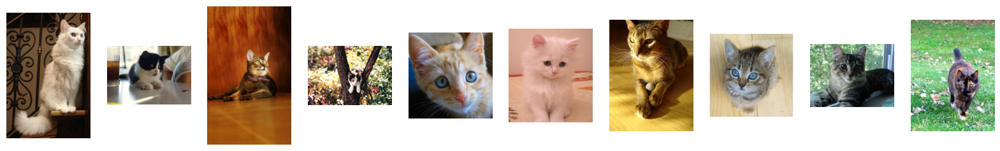

bottom 10 cats


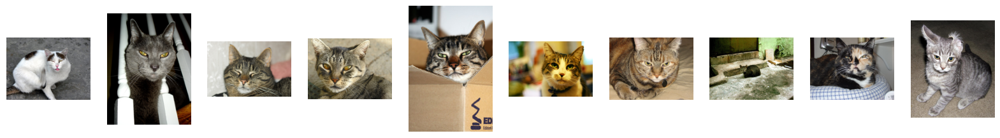

In [10]:
print('top 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

## Test alternative sentences

### cute/ugly

top 10 cats


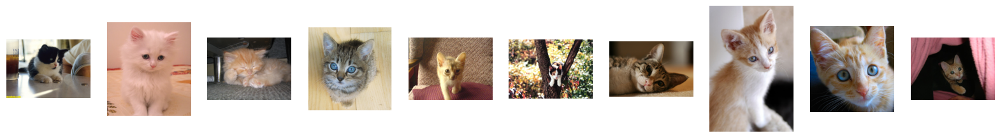

bottom 10 cats


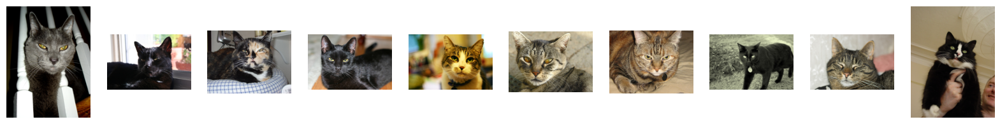

In [11]:
texts = ["picture of a cute cat", "picture of an ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)

print('top 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

### handsome/ugly

top 10 cats


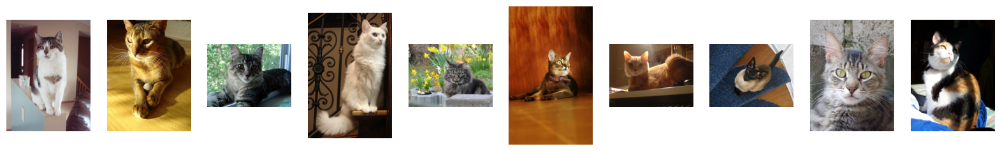

bottom 10 cats


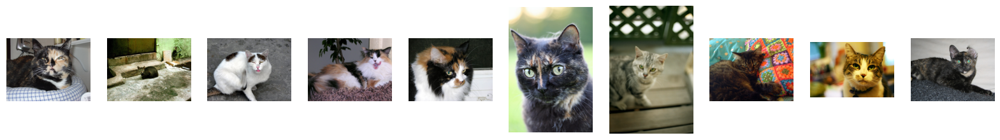

In [12]:
texts = ["picture of a handsome cat", "picture of an ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)

print('top 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

### remove "picture of a"

top 10 cats


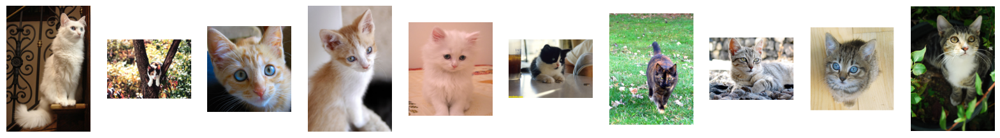

bottom 10 cats


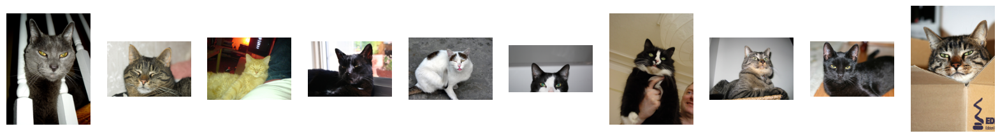

In [13]:
texts = ["pretty cat", "ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)

print('top 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

top 10 cats


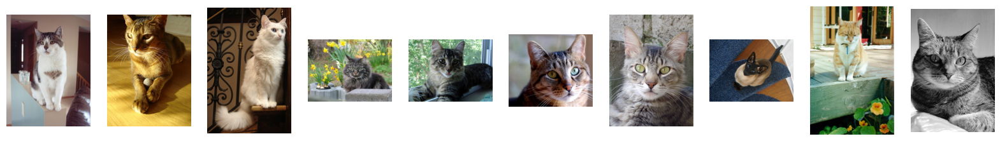

bottom 10 cats


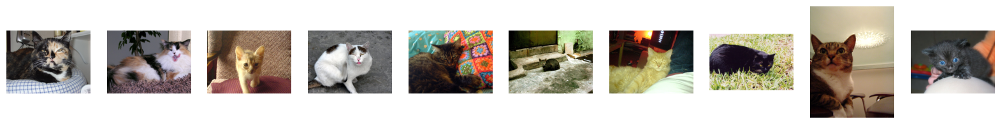

In [14]:
texts = ["handsome cat", "ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)

print('top 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(cat_result.sort_values(by=['pretty'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

### Conclusion  

The removal of "picture of a" seems to focus more on the cat element.  
We will only use short sentences to compare embeddings from now on.  

## Use several descriptions to create many scores, and get a global score

### find positive and negative descriptors

We make a list of postive descriptions, and their corresponding opposite negative descriptions.  

In [15]:
positive_descriptions = [
    "beautiful cat", "cute cat", "lovely cat", "charming cat", "adorable cat",
    "elegant cat", "graceful cat", "pretty cat", "handsome cat", "gorgeous cat",
    "photogenic cat", "delightful cat", "attractive cat", "sweet cat", "stunning cat",
    "majestic cat", "fluffy cat", "playful cat", "happy cat", "appealing cat"
]

negative_descriptions = [
    "ugly cat", "unattractive cat", "plain cat", "unappealing cat", "awkward cat",
    "scruffy cat", "clumsy cat", "homely cat", "ordinary cat", "unphotogenic cat",
    "drab cat", "bland cat", "dull cat", "unpleasant cat", "frumpy cat",
    "shabby cat", "messy cat", "grouchy cat", "sad cat", "uncharming cat"
]

In [16]:
len(positive_descriptions), len(negative_descriptions)

(20, 20)

In [17]:
for pos_desc, neg_desc in zip(positive_descriptions, negative_descriptions):
  print(pos_desc + " - " + neg_desc)

beautiful cat - ugly cat
cute cat - unattractive cat
lovely cat - plain cat
charming cat - unappealing cat
adorable cat - awkward cat
elegant cat - scruffy cat
graceful cat - clumsy cat
pretty cat - homely cat
handsome cat - ordinary cat
gorgeous cat - unphotogenic cat
photogenic cat - drab cat
delightful cat - bland cat
attractive cat - dull cat
sweet cat - unpleasant cat
stunning cat - frumpy cat
majestic cat - shabby cat
fluffy cat - messy cat
playful cat - grouchy cat
happy cat - sad cat
appealing cat - uncharming cat


### update inference function to add a number to the positive column, and only keep positive

In [18]:
def get_similarity_scores_batch(image_paths, texts, index):
    try:
        # Load images
        images = [load_image(image_path) for image_path in image_paths]

        # Prepare processor inputs
        inputs = processor(text=texts, images=images, return_tensors="pt", padding=True)

        # Move tensors to GPU if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        inputs = {key: value.to(device) for key, value in inputs.items()}
        model.to(device)

        # Get model outputs
        outputs = model(**inputs)
        logits_per_image = outputs.logits_per_image
        logits_per_text = outputs.logits_per_text

        # Calculate similarity scores
        similarity_scores = logits_per_image.softmax(dim=1)

        # Convert output tensor to dataframe
        similarity_scores_df = pd.DataFrame(similarity_scores.detach().cpu().numpy(), columns=['pretty', 'ugly'])
        similarity_scores_df = similarity_scores_df[['pretty']]
        similarity_scores_df.columns = [f"{index.replace(' ', '_')}_score"]

        # Add image paths as first column
        similarity_scores_df.insert(0, 'image_path', image_paths)

    finally:
        # Ensure to free up VRAM
        del images, inputs, outputs, logits_per_image, logits_per_text, similarity_scores
        torch.cuda.empty_cache()
        gc.collect()

    return similarity_scores_df

In [19]:
cat_results = []
for index, (pos_desc, neg_desc) in enumerate(zip(positive_descriptions, negative_descriptions)):
  texts = [pos_desc, neg_desc]
  cat_result = get_similarity_scores_batch(image_bytes_list, texts, pos_desc)
  cat_results.append(cat_result)

In [20]:
from functools import reduce
multi_score_cats_df = reduce(lambda x, y: x.merge(y, on='image_path'), cat_results)

In [21]:
multi_score_cats_df.head(5)

,image_path,beautiful_cat_score,cute_cat_score,lovely_cat_score,charming_cat_score,adorable_cat_score,elegant_cat_score,graceful_cat_score,pretty_cat_score,handsome_cat_score,...,photogenic_cat_score,delightful_cat_score,attractive_cat_score,sweet_cat_score,stunning_cat_score,majestic_cat_score,fluffy_cat_score,playful_cat_score,happy_cat_score,appealing_cat_score
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.767632,0.366131,0.691796,0.557288,0.783916,0.209509,0.655012,0.659694,0.852527,...,0.452967,0.462304,0.228616,0.704725,0.895363,0.113600,0.592837,0.270643,0.622679,0.453587
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.862805,0.944735,0.585721,0.612870,0.946121,0.124159,0.191737,0.523545,0.178291,...,0.302376,0.772621,0.121584,0.947762,0.696028,0.132853,0.849637,0.713726,0.436639,0.589719
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.309878,0.285487,0.698432,0.371211,0.255978,0.194632,0.450766,0.222618,0.852424,...,0.286652,0.721764,0.306074,0.472127,0.266638,0.064997,0.350258,0.068227,0.497078,0.307401
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.936180,0.710370,0.824452,0.860763,0.855855,0.305640,0.618343,0.797510,0.769185,...,0.834657,0.756626,0.653892,0.696167,0.975002,0.458551,0.709355,0.645666,0.412228,0.475107
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.201248,0.060543,0.525484,0.144350,0.193757,0.590860,0.865887,0.145449,0.926404,...,0.164369,0.533483,0.152545,0.093230,0.550263,0.266238,0.123698,0.005111,0.279080,0.179361


In [22]:
multi_score_cats_df['sum_score']= multi_score_cats_df[list(multi_score_cats_df.filter(regex='score'))].sum(axis=1)


top 10 cats


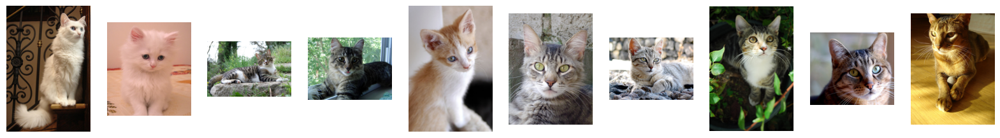

bottom 10 cats


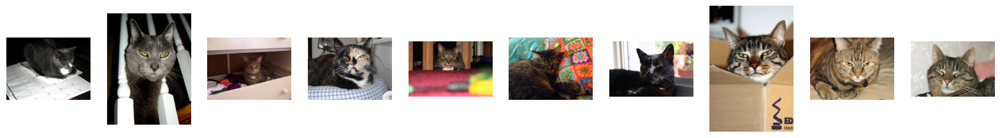

In [23]:
print('top 10 cats')
small_images = list(multi_score_cats_df.sort_values(by=['sum_score'], ascending=False).head(10).image_path.apply(convert_images))
display_images(small_images)

print('bottom 10 cats')
small_images = list(multi_score_cats_df.sort_values(by=['sum_score'], ascending=True).head(10).image_path.apply(convert_images))
display_images(small_images)

In [24]:
del multi_score_cats_df['image_path']

In [25]:
multi_score_cats_df.to_csv('export.csv')

## Scores seem good enough, lets apply to the complete dataset.

In [26]:
# remove previous objects to free up some ram
del cat_result
del sample_df

### get all indexes for all batches

In [27]:
images_to_process_count = len(cats_ds)
batch_size = 250
start_index = 0
end_index = start_index+batch_size
number_of_batches = images_to_process_count // batch_size
index_list = []

for i in range(number_of_batches-1):
  index_list.append((start_index, end_index))
  # print(f'{start_index} - {end_index}')
  start_index = end_index
  end_index = start_index+batch_size
# print(f'{start_index} - {end_index}')
index_list.append((start_index, end_index))

remaining_samples = images_to_process_count - end_index
# print(f'remaining samples: {remaining_samples}')
start_index = end_index
end_index = end_index+remaining_samples
index_list.append((start_index, end_index))
index_list

[(0, 250),
 (250, 500),
 (500, 750),
 (750, 1000),
 (1000, 1250),
 (1250, 1500),
 (1500, 1750),
 (1750, 2000),
 (2000, 2250),
 (2250, 2500),
 (2500, 2750),
 (2750, 3000),
 (3000, 3250),
 (3250, 3500),
 (3500, 3750),
 (3750, 4000),
 (4000, 4250),
 (4250, 4500),
 (4500, 4750),
 (4750, 5000),
 (5000, 5250),
 (5250, 5500),
 (5500, 5750),
 (5750, 6000),
 (6000, 6250),
 (6250, 6500),
 (6500, 6750),
 (6750, 7000),
 (7000, 7250),
 (7250, 7500),
 (7500, 7750),
 (7750, 8000),
 (8000, 8250),
 (8250, 8500),
 (8500, 8750),
 (8750, 9000),
 (9000, 9250),
 (9250, 9500),
 (9500, 9750),
 (9750, 9936)]

In [28]:
from tqdm.auto import tqdm

result_list = []
# all batches loop
for indexes in tqdm(index_list, desc="Cat beauty inference in progress..."):
  cats_df = cats_ds.select(range(*indexes)).to_pandas()
  image_bytes_list = list(cats_df.image.apply(get_bytes))
  # all descriptors loop
  cat_results = []
  for (pos_desc, neg_desc) in tqdm(zip(positive_descriptions, negative_descriptions), desc='computing descriptors'):
    texts = [pos_desc, neg_desc]
    cat_result = get_similarity_scores_batch(image_bytes_list, texts, pos_desc)
    cat_results.append(cat_result)
  multi_score_cats_df = reduce(lambda x, y: x.merge(y, on='image_path'), cat_results)
  result_list.append(multi_score_cats_df)

Cat beauty inference in progress...:   0%|          | 0/40 [00:00<?, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

computing descriptors: 0it [00:00, ?it/s]

In [29]:
results = pd.concat(result_list)
len(results.image_path.unique())

9936

In [30]:
# remove image data to save a light CSV file
del results['image_path']

In [31]:
results.to_csv('results.csv')

In [32]:
# download result in case of deconnexion in the meantime
from google.colab import files
files.download('results.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [33]:
results['total_score']= results[list(results.filter(regex='score'))].sum(axis=1)

In [34]:
results

,beautiful_cat_score,cute_cat_score,lovely_cat_score,charming_cat_score,adorable_cat_score,elegant_cat_score,graceful_cat_score,pretty_cat_score,handsome_cat_score,gorgeous_cat_score,...,delightful_cat_score,attractive_cat_score,sweet_cat_score,stunning_cat_score,majestic_cat_score,fluffy_cat_score,playful_cat_score,happy_cat_score,appealing_cat_score,total_score
0,0.589286,0.576306,0.132541,0.307149,0.038488,0.814061,0.297216,0.079813,0.030168,0.065255,...,0.298929,0.066193,0.208879,0.411207,0.062909,0.542850,0.448837,0.203420,0.504573,5.699641
1,0.837402,0.657552,0.564285,0.619448,0.359760,0.422327,0.449914,0.543814,0.547130,0.358940,...,0.425961,0.271673,0.566829,0.791957,0.427756,0.308532,0.898079,0.811604,0.707209,10.925525
2,0.891200,0.685286,0.513511,0.608526,0.669518,0.186261,0.769539,0.434011,0.260518,0.674983,...,0.736502,0.296526,0.549538,0.547796,0.125578,0.899710,0.267709,0.614014,0.609668,10.483436
3,0.274913,0.217159,0.650821,0.278580,0.863489,0.161941,0.503736,0.798617,0.778050,0.460090,...,0.366730,0.694828,0.200030,0.819994,0.356004,0.927082,0.008458,0.045809,0.377488,9.346219
4,0.949879,0.814070,0.663648,0.899234,0.889771,0.671900,0.651405,0.743471,0.834020,0.857581,...,0.798661,0.334829,0.915511,0.984404,0.221592,0.819155,0.716152,0.882690,0.540212,14.950345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,0.562592,0.283314,0.069395,0.162229,0.314501,0.602165,0.860206,0.201902,0.223982,0.302233,...,0.668289,0.221837,0.508730,0.070583,0.323132,0.579598,0.831776,0.954386,0.890650,8.716127
182,0.921662,0.685334,0.784452,0.877612,0.748283,0.607180,0.748423,0.592329,0.866607,0.861869,...,0.834046,0.748352,0.920637,0.959297,0.438679,0.745230,0.786907,0.657921,0.409647,15.052858
183,0.120296,0.157053,0.606166,0.138157,0.174005,0.618276,0.032952,0.358940,0.314233,0.098743,...,0.164496,0.220558,0.020479,0.142524,0.247722,0.035197,0.071862,0.026069,0.439839,4.153050
184,0.913795,0.394730,0.759457,0.815798,0.458635,0.851857,0.522026,0.537640,0.846609,0.753013,...,0.810527,0.755265,0.593878,0.947639,0.487630,0.313389,0.660281,0.875788,0.580656,13.457958


In [40]:
results.index.name = 'image_index'

In [43]:
results.reset_index(inplace=True)

In [44]:
results

,image_index,beautiful_cat_score,cute_cat_score,lovely_cat_score,charming_cat_score,adorable_cat_score,elegant_cat_score,graceful_cat_score,pretty_cat_score,handsome_cat_score,...,delightful_cat_score,attractive_cat_score,sweet_cat_score,stunning_cat_score,majestic_cat_score,fluffy_cat_score,playful_cat_score,happy_cat_score,appealing_cat_score,total_score
0,0,0.589286,0.576306,0.132541,0.307149,0.038488,0.814061,0.297216,0.079813,0.030168,...,0.298929,0.066193,0.208879,0.411207,0.062909,0.542850,0.448837,0.203420,0.504573,5.699641
1,1,0.837402,0.657552,0.564285,0.619448,0.359760,0.422327,0.449914,0.543814,0.547130,...,0.425961,0.271673,0.566829,0.791957,0.427756,0.308532,0.898079,0.811604,0.707209,10.925525
2,2,0.891200,0.685286,0.513511,0.608526,0.669518,0.186261,0.769539,0.434011,0.260518,...,0.736502,0.296526,0.549538,0.547796,0.125578,0.899710,0.267709,0.614014,0.609668,10.483436
3,3,0.274913,0.217159,0.650821,0.278580,0.863489,0.161941,0.503736,0.798617,0.778050,...,0.366730,0.694828,0.200030,0.819994,0.356004,0.927082,0.008458,0.045809,0.377488,9.346219
4,4,0.949879,0.814070,0.663648,0.899234,0.889771,0.671900,0.651405,0.743471,0.834020,...,0.798661,0.334829,0.915511,0.984404,0.221592,0.819155,0.716152,0.882690,0.540212,14.950345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9931,181,0.562592,0.283314,0.069395,0.162229,0.314501,0.602165,0.860206,0.201902,0.223982,...,0.668289,0.221837,0.508730,0.070583,0.323132,0.579598,0.831776,0.954386,0.890650,8.716127
9932,182,0.921662,0.685334,0.784452,0.877612,0.748283,0.607180,0.748423,0.592329,0.866607,...,0.834046,0.748352,0.920637,0.959297,0.438679,0.745230,0.786907,0.657921,0.409647,15.052858
9933,183,0.120296,0.157053,0.606166,0.138157,0.174005,0.618276,0.032952,0.358940,0.314233,...,0.164496,0.220558,0.020479,0.142524,0.247722,0.035197,0.071862,0.026069,0.439839,4.153050
9934,184,0.913795,0.394730,0.759457,0.815798,0.458635,0.851857,0.522026,0.537640,0.846609,...,0.810527,0.755265,0.593878,0.947639,0.487630,0.313389,0.660281,0.875788,0.580656,13.457958


In [45]:
def build_image_url(image_index):
  return f"https://storage.googleapis.com/pretty_cats/image_{image_index}.jpg"

results['image_url'] = results.image_index.apply(build_image_url)

In [47]:
results.head(5)

,image_index,beautiful_cat_score,cute_cat_score,lovely_cat_score,charming_cat_score,adorable_cat_score,elegant_cat_score,graceful_cat_score,pretty_cat_score,handsome_cat_score,...,attractive_cat_score,sweet_cat_score,stunning_cat_score,majestic_cat_score,fluffy_cat_score,playful_cat_score,happy_cat_score,appealing_cat_score,total_score,image_url
0,0,0.589286,0.576306,0.132541,0.307149,0.038488,0.814061,0.297216,0.079813,0.030168,...,0.066193,0.208879,0.411207,0.062909,0.542850,0.448837,0.203420,0.504573,5.699641,https://storage.googleapis.com/pretty_cats/ima...
1,1,0.837402,0.657552,0.564285,0.619448,0.359760,0.422327,0.449914,0.543814,0.547130,...,0.271673,0.566829,0.791957,0.427756,0.308532,0.898079,0.811604,0.707209,10.925525,https://storage.googleapis.com/pretty_cats/ima...
2,2,0.891200,0.685286,0.513511,0.608526,0.669518,0.186261,0.769539,0.434011,0.260518,...,0.296526,0.549538,0.547796,0.125578,0.899710,0.267709,0.614014,0.609668,10.483436,https://storage.googleapis.com/pretty_cats/ima...
3,3,0.274913,0.217159,0.650821,0.278580,0.863489,0.161941,0.503736,0.798617,0.778050,...,0.694828,0.200030,0.819994,0.356004,0.927082,0.008458,0.045809,0.377488,9.346219,https://storage.googleapis.com/pretty_cats/ima...
4,4,0.949879,0.814070,0.663648,0.899234,0.889771,0.671900,0.651405,0.743471,0.834020,...,0.334829,0.915511,0.984404,0.221592,0.819155,0.716152,0.882690,0.540212,14.950345,https://storage.googleapis.com/pretty_cats/ima...


In [48]:
results.to_csv('/content/drive/MyDrive/AI/cats/9k_cats_multi_scores.csv', index=False)